In [1]:
import os
from pathlib import Path
from typing import Any
from dataclasses import dataclass
from typing import Literal
from collections import defaultdict

import seaborn as sns
import torch
from tqdm.auto import tqdm
from sklearn.decomposition import PCA
import pandas as pd
import matplotlib.pyplot as plt
from torch import Tensor

from hallucinations.datasets.utils import load_qa_metrics
from hallucinations.features import load_hidden_state_features_from_shards, Features

os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
sns.set_theme("notebook")

# Analyze data
* `attention_mask`:  torch.Size([64, 150])
* `special_token_mask`:  torch.Size([64, 200])
* `decoder_token_mask`:  torch.Size([64, 200])
* `input_length`:  <class 'int'>
* `hidden_states`:  <class 'list'> (num_layers + `shape: [batch_size, sequence_length, hidden_dim]`)

In [2]:
root_dir = Path(
    "data/activations/nq_open/llama_3.1_8b_instruct/sampling_high_temp_with_activations__prompt_short_few_shot_sep__seed_42"
)
act_path = root_dir / "activations"
hidden_states = load_hidden_state_features_from_shards(act_path, Features("all", True, True))

Loading hidden states: 100%|██████████| 57/57 [00:11<00:00,  5.14it/s]


In [3]:
print(len(hidden_states["hs_last_generated_token"]))
hidden_states["hs_last_generated_token"][0].shape

33


torch.Size([3610, 4096])

In [6]:
metrics = load_qa_metrics(root_dir)
metrics["llm_as_judge"] = metrics["llm_as_judge"].str.replace(r"\W", "", regex=True).str.lower()
metrics.head()

,prediction,gold,squad_f1,squad_exact_match,rougeL_fmeasure,rougeL_precision,rougeL_recall,llm_as_judge
0,"December 11, 1972, specifically the last time ...","[14 December 1972 UTC, December 1972]",0.266667,0.0,0.222222,0.125,1.0,incorrect
1,Bob Calvert.,"[Bobby Scott, Bob Russell]",0.500000,0.0,0.500000,0.500,0.5,incorrect
2,"I couldn't find any information on ""The Bastar...","[one, one season]",0.000000,0.0,0.000000,0.000,0.0,abstaining
3,"I'm sorry, I am unable to verify the year the ...",[2017],0.000000,0.0,0.000000,0.000,0.0,abstaining
4,I don't have access to real-time information o...,[South Carolina],0.000000,0.0,0.000000,0.000,0.0,abstaining


# Abstaining directions

/home/jbinkowski/miniconda3/envs/hallucinations/lib/python3.12/site-packages/sklearn/decomposition/_pca.py:794: RuntimeWarning: invalid value encountered in divide
  self.explained_variance_ratio_ = self.explained_variance_ / total_var


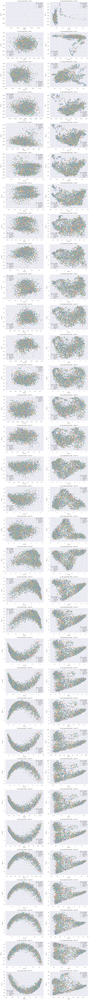

In [9]:
reducer = PCA(n_components=8)

NUM_LAYERS = len(hidden_states["hs_last_generated_token"])
LAYER_IDX = list(range(NUM_LAYERS))

fig, axes = plt.subplots(NUM_LAYERS, len(hidden_states), figsize=(15, 5*NUM_LAYERS), squeeze=False)
for layer_idx in LAYER_IDX:
    for (feat_name, feat_data), ax in zip(hidden_states.items(), axes[layer_idx]):
        projs = reducer.fit_transform(feat_data[layer_idx].float().numpy())
        x = sns.scatterplot(x=projs[:, 0], y=projs[:, 1], hue=metrics["llm_as_judge"], ax=ax)
        ax.set(xlabel="PCA 1", ylabel="PCA 2", title=f"{feat_name} - Layer {layer_idx}")
        
fig.tight_layout()
plt.show()